# Initial Conditions Optimization
## Plot History

In [166]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import matplotlib.style as style
style.use('fivethirtyeight')
import ray
import io
import os
from IPython.display import display, HTML, Markdown

## Load PlayFair Display and Roboto Fonts from Google

In [167]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

github_url = 'https://github.com/google/fonts/blob/master/ofl/playfairdisplay/static/PlayfairDisplay-Regular.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
heading_font = fm.FontProperties(fname=f.name, size=28)

github_url = 'https://github.com/google/fonts/blob/master/ofl/roboto/static/Roboto-Regular.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
subtitle_font = fm.FontProperties(fname=f.name, size=20)


## Load Humor Sans Font

In [168]:
github_url = 'http://antiyawn.com/uploads/Humor-Sans-1.0.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
comic_font = fm.FontProperties(fname=f.name, size=18)

# Main code

In [169]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [170]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC
0,DRS 01 - Grande São Paulo,2020-03-20,200,2000000.0,0.0001,0.0001,800.0000,300.0000,400.0000,0,0.15,0.15,0.05
1,DRS 02 - Araçatuba,2020-04-01,200,500.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
2,DRS 03 - Araraquara,2020-04-01,200,2000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
3,DRS 04 - Baixada Santista,2020-04-01,200,8000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
4,DRS 05 - Barretos,2020-04-01,200,2000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
5,DRS 06 - Bauru,2020-04-01,200,10000.0,0.0001,0.0001,4.0000,0.0001,0.0001,0,0.15,0.40,0.10
6,DRS 07 - Campinas,2020-04-01,200,20000.0,0.0001,0.0001,40.0000,0.0001,0.0001,0,0.15,0.40,0.10
7,DRS 08 - Franca,2020-04-01,200,1000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
8,DRS 09 - Marília,2020-04-01,200,5000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
9,DRS 10 - Piracicaba,2020-04-01,200,10000.0,0.0001,0.0001,0.0001,0.0001,1.0000,0,0.15,0.40,0.10


## Select data set

In [171]:
opt=2

#select history file version, model and states
if opt==0:
    #original s0,i0,d0 based on param.csv file
    version=105
    model="Yabox"
    DRS=dfparam.DRS

if opt==1:
    #introduced s0 based on population
    #SP went too high on s0 and wcases
    version=106
    model="Yabox"
    DRS=dfparam.DRS

if opt==2:
    #improved range for s0,i0,d0 and weights
    #increased delta startdate +-3
    version=107
    model="Yabox"
    DRS=dfparam.DRS

In [172]:
strFile="results/IC_optimizeddistrictRegions"+str(version)+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot and Save Results

# Results for DRS 01 - Grande São Paulo District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1016,32985761,2020-03-18,117,7840120,136,196,0.495,0.0081


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1016,32985761,2020-03-18,117,7840120,136,196,0.4950,0.0081
1239,39496096,2020-03-19,88,8568050,644,31,0.3971,0.0199
1528,72818497,2020-03-21,141,8296245,281,28,0.4507,0.0045
1248,106676419,2020-03-19,113,8057389,592,157,0.5174,0.0119
1412,123837266,2020-03-21,94,8345085,352,2,0.3926,0.0189


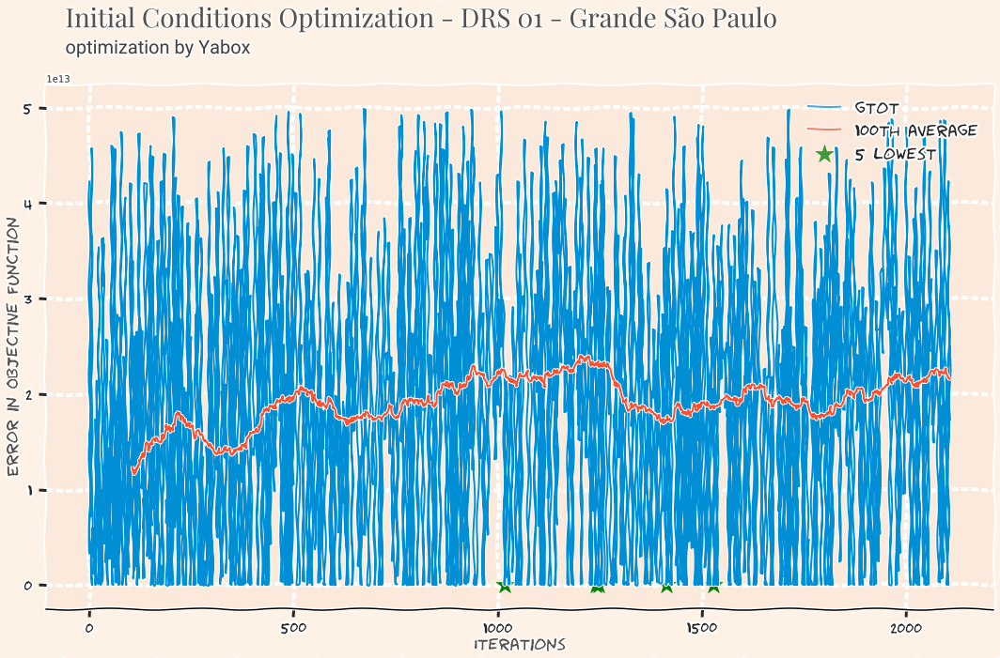

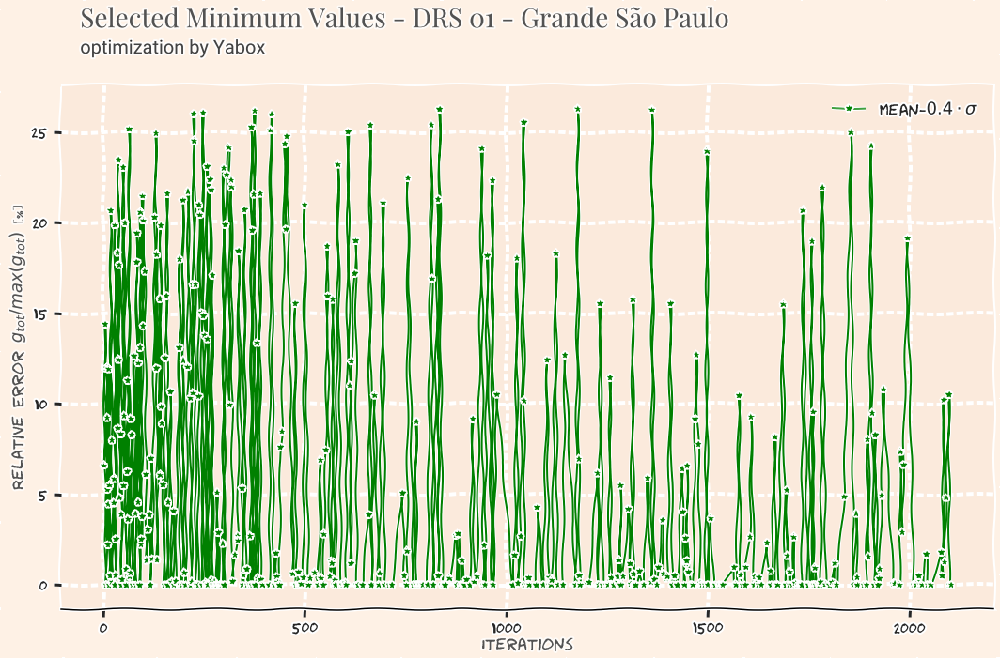

# Results for DRS 02 - Araçatuba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2714,32896,2020-03-29,5,282699,182,51,0.6257,0.0362


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2714,32896,2020-03-29,5,282699,182,51,0.6257,0.0362
2514,34206,2020-03-29,32,307969,140,57,0.6107,0.0432
2291,38671,2020-03-30,9,314174,124,71,0.5697,0.0094
2158,41268,2020-03-31,9,285694,173,81,0.5641,0.0410
30,41533,2020-04-02,149,19670,523,24,0.5584,0.0477


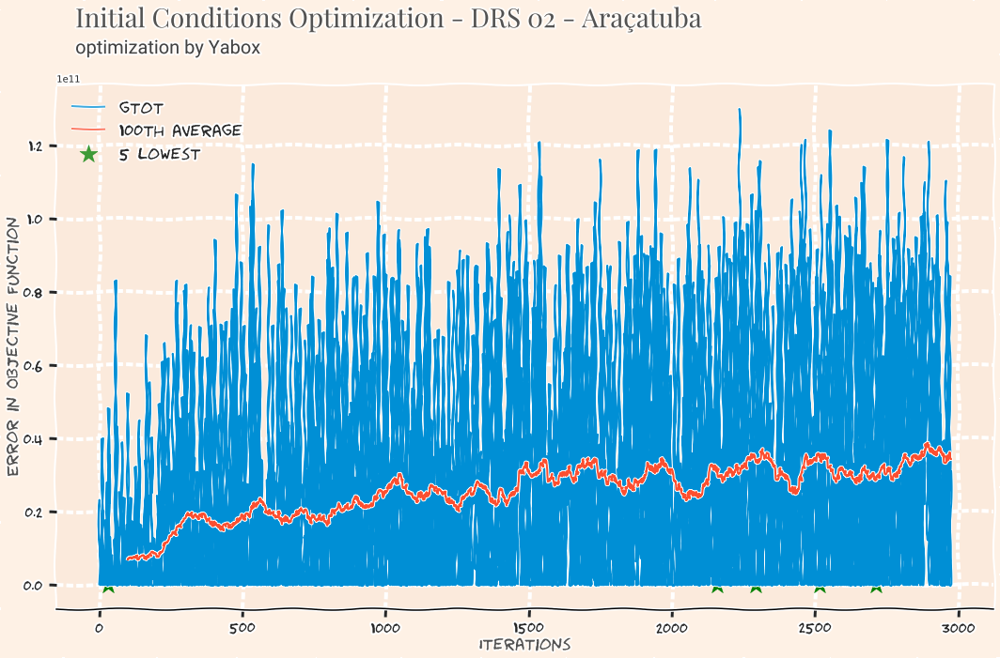

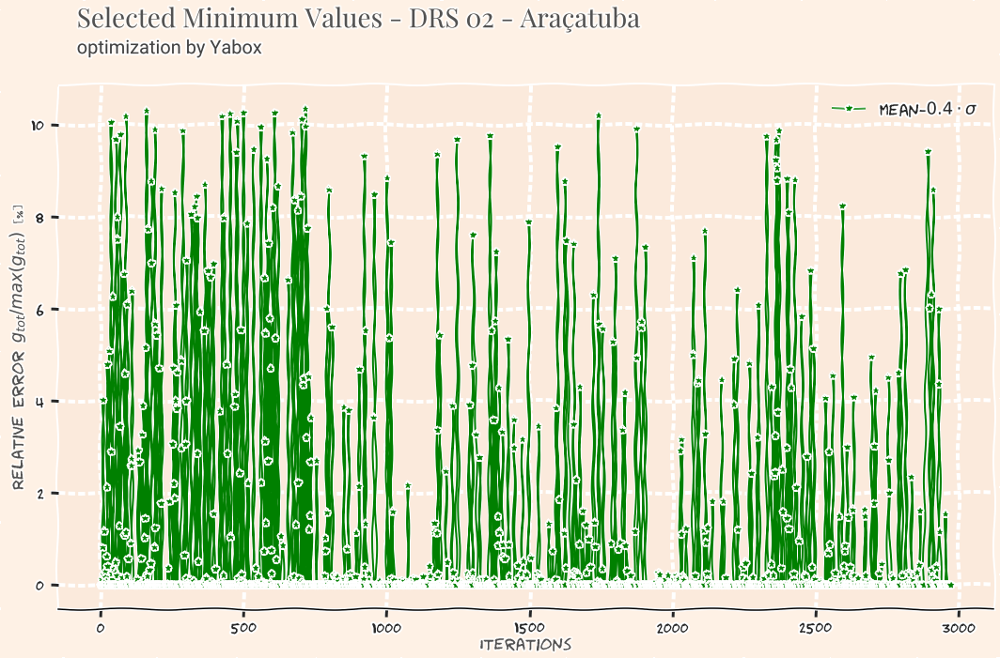

# Results for DRS 03 - Araraquara District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2715,26950,2020-03-30,93,377711,534,102,0.5056,0.0034


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2715,26950,2020-03-30,93,377711,534,102,0.5056,0.0034
2614,62115,2020-04-02,154,409008,57,122,0.3919,0.0104
2292,71813,2020-03-29,42,402902,99,139,0.5371,0.0167
80,80231,2020-04-03,130,175004,425,158,0.3979,0.0302
676,93622,2020-04-01,241,343766,878,68,0.5511,0.0271


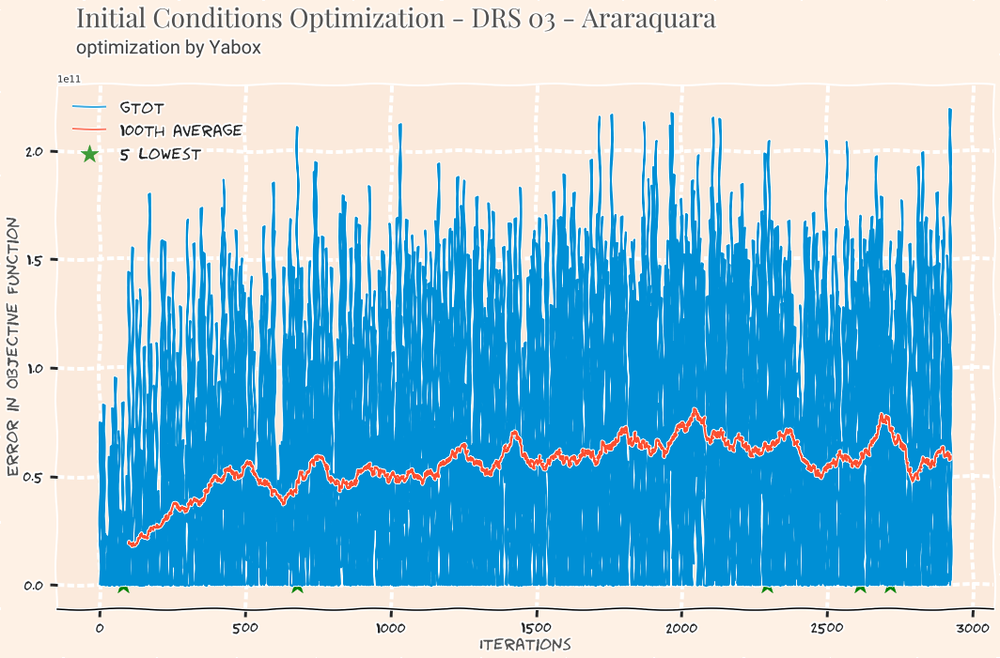

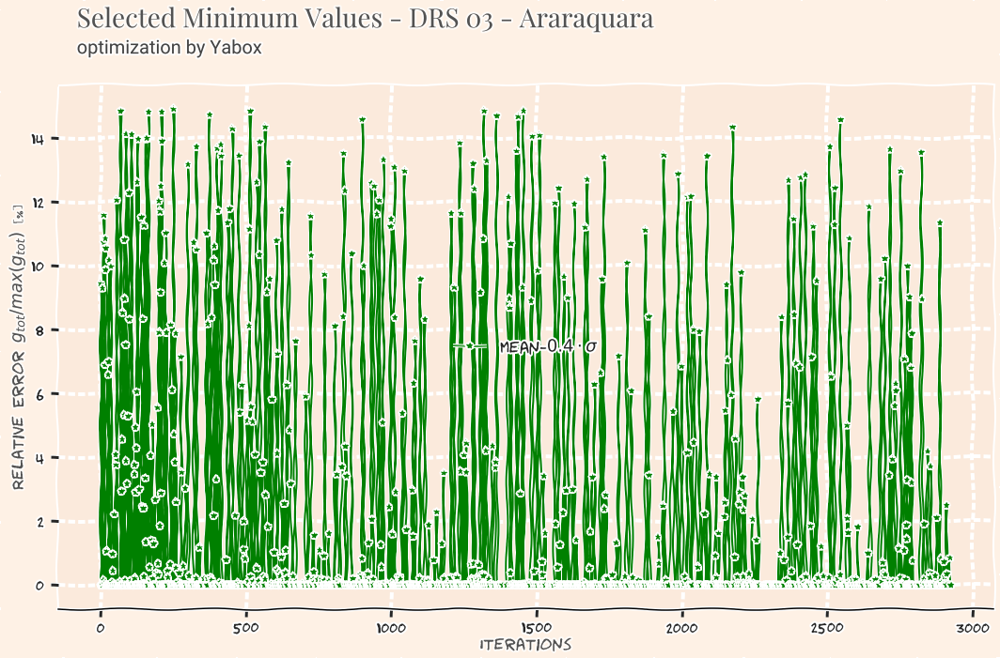

# Results for DRS 04 - Baixada Santista District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1526,1454767,2020-04-01,155,718013,270,281,0.4062,0.0124


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1526,1454767,2020-04-01,155,718013,270,281,0.4062,0.0124
273,1541123,2020-04-01,71,164408,24,175,0.5567,0.0020
203,3293002,2020-04-03,124,422347,187,116,0.4668,0.0020
689,3897517,2020-03-31,6,691207,137,126,0.3824,0.0276
836,4154078,2020-04-03,163,596008,665,30,0.3974,0.0300


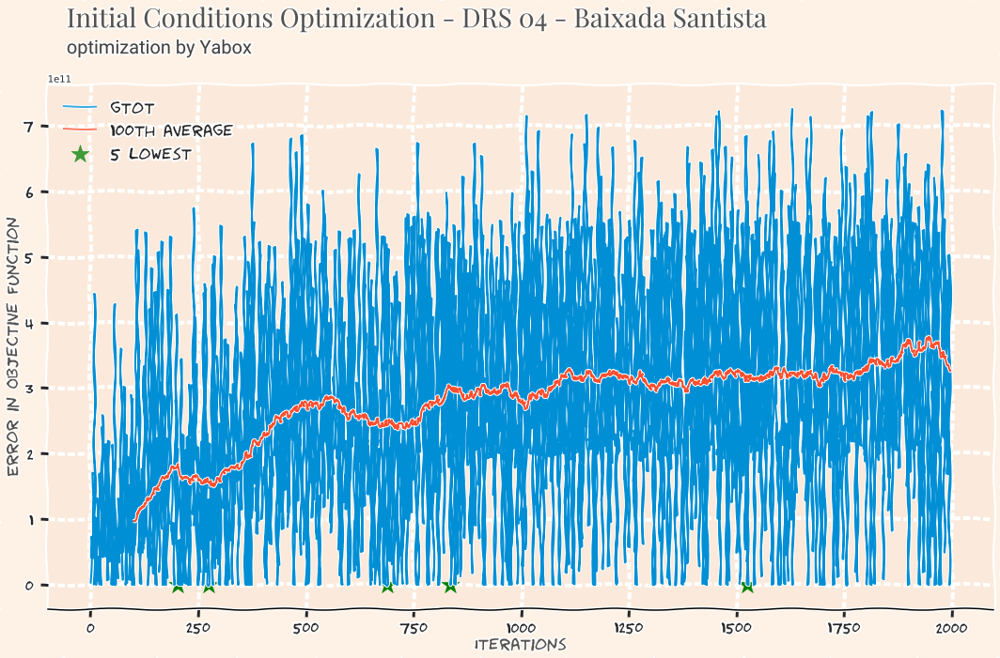

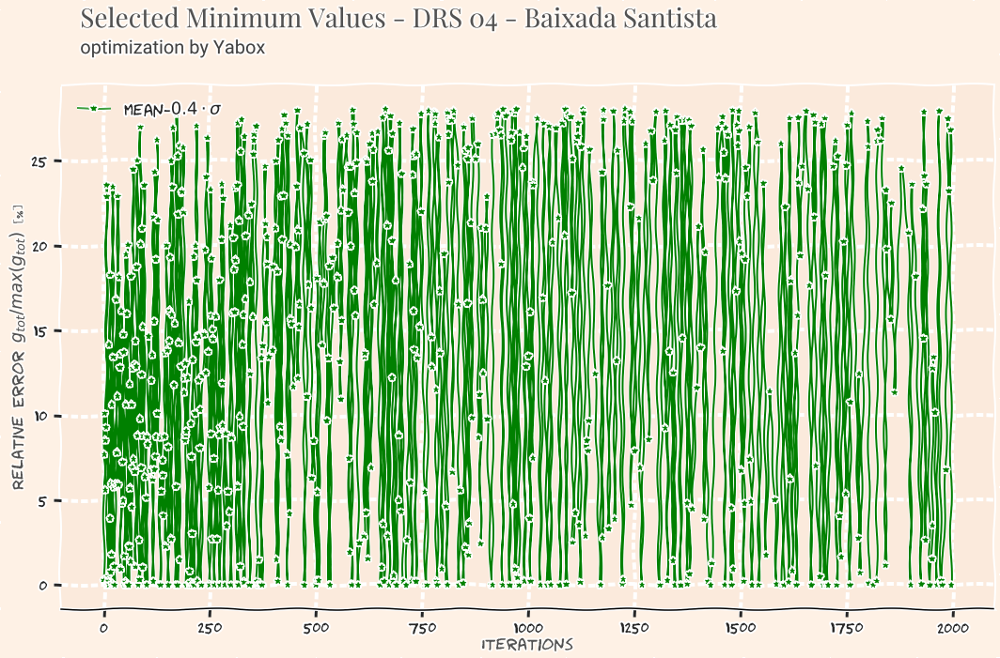

# Results for DRS 05 - Barretos District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
776,2136,2020-04-03,105,147064,883,14,0.3535,0.0211


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
776,2136,2020-04-03,105,147064,883,14,0.3535,0.0211
984,30869,2020-03-30,68,163130,241,160,0.3639,0.0215
1512,35111,2020-04-01,7,174936,81,38,0.5084,0.0295
2598,40989,2020-04-02,96,172736,21,20,0.5212,0.0129
2191,46051,2020-04-01,199,174094,134,66,0.5021,0.0166


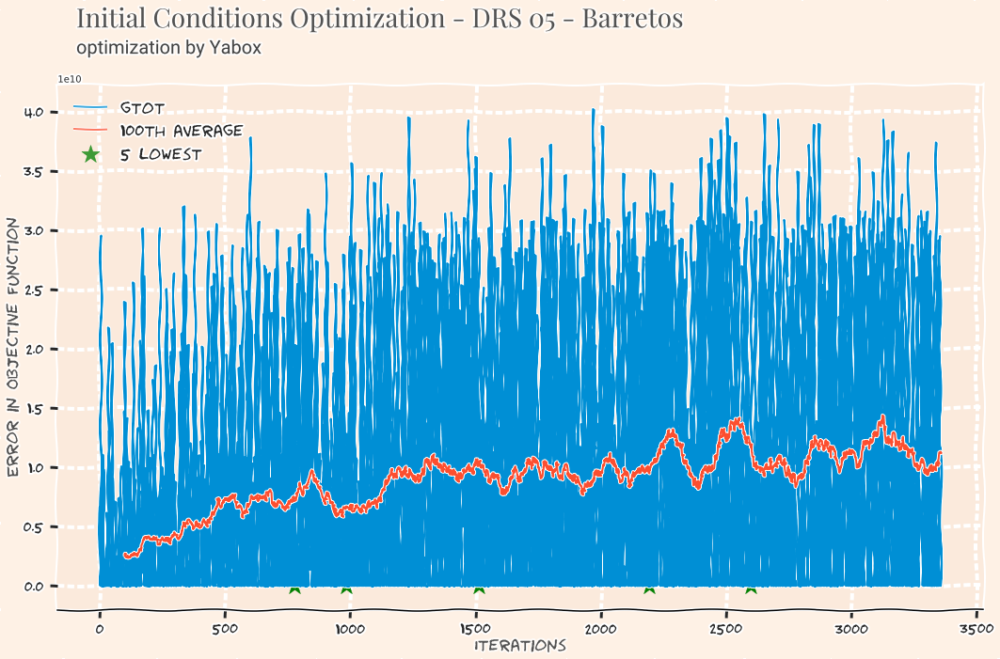

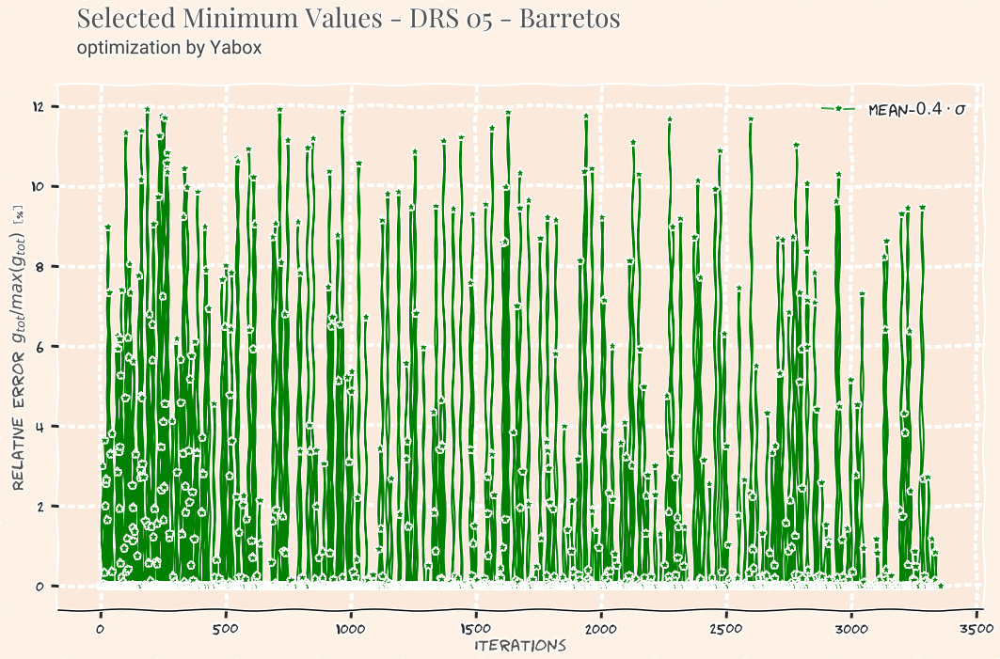

# Results for DRS 06 - Bauru District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1122,177999,2020-04-01,59,717995,263,201,0.5443,0.0304


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1122,177999,2020-04-01,59,717995,263,201,0.5443,0.0304
1160,303845,2020-03-29,139,615693,589,84,0.3744,0.0456
1298,372086,2020-04-01,145,612578,165,22,0.5621,0.0027
1679,378976,2020-04-01,71,683606,103,17,0.5866,0.0176
1548,406468,2020-04-03,93,696134,183,75,0.5874,0.0062


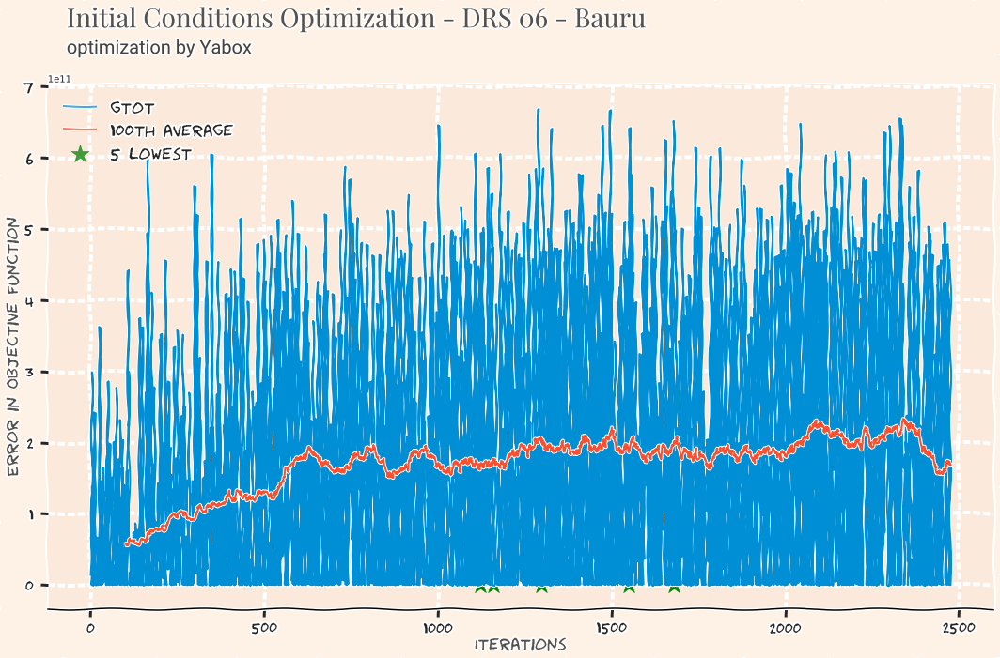

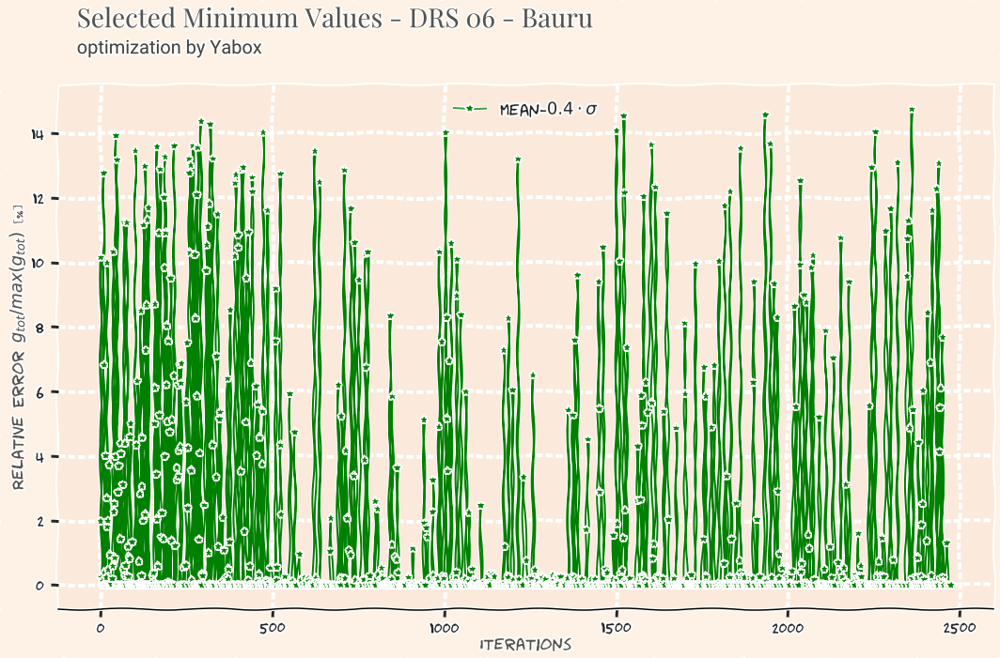

# Results for DRS 07 - Campinas District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
564,2951833,2020-03-29,20,1865626,602,9,0.5461,0.0282


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
564,2951833,2020-03-29,20,1865626,602,9,0.5461,0.0282
575,3227085,2020-03-30,192,1334168,128,109,0.6112,0.0081
308,3784529,2020-03-29,118,1044307,649,3,0.6279,0.0064
567,5681999,2020-04-03,137,965040,558,139,0.3696,0.0313
230,6674698,2020-03-29,81,1231471,288,149,0.3853,0.0169


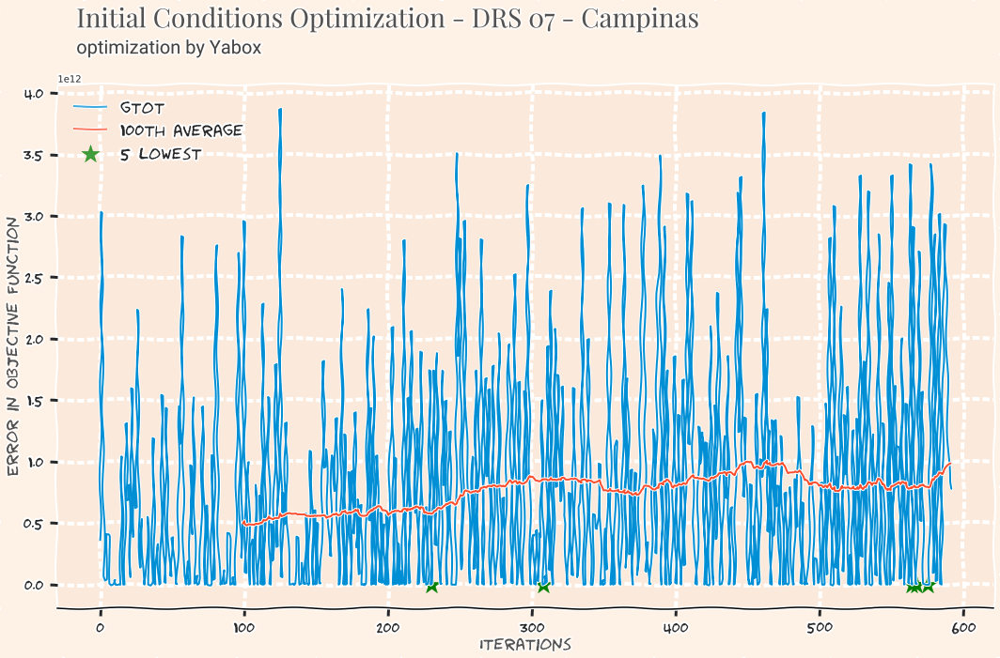

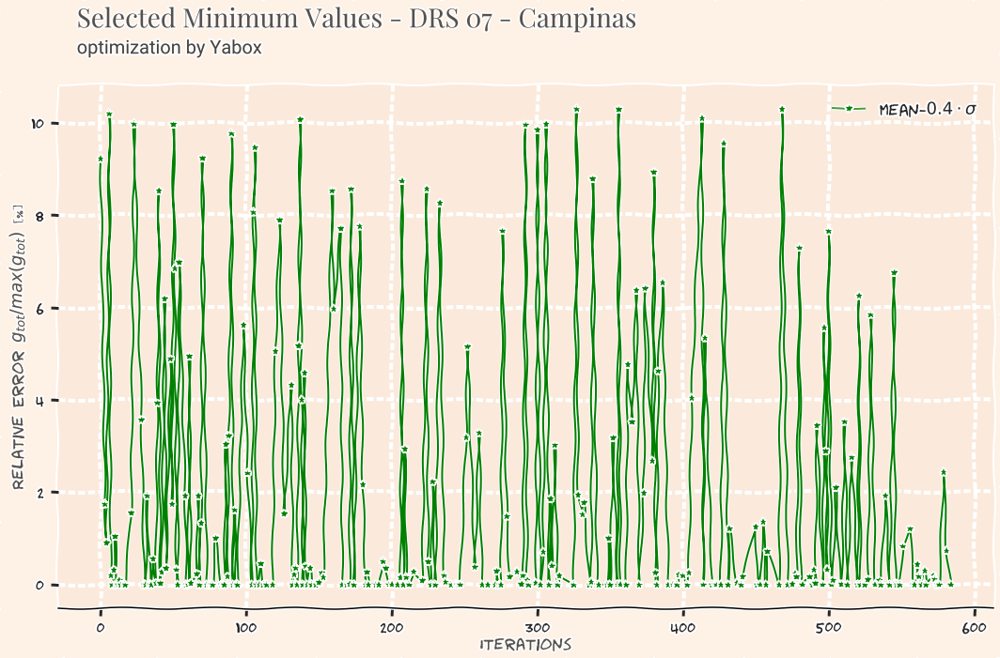

# Results for DRS 08 - Franca District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2503,13666,2020-04-01,3,237187,37,26,0.4088,0.0257


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2503,13666,2020-04-01,3,237187,37,26,0.4088,0.0257
1786,15355,2020-03-31,37,269436,106,19,0.6443,0.0285
2758,19889,2020-04-02,40,284852,150,20,0.5635,0.0289
1132,20371,2020-04-02,10,224040,189,59,0.6465,0.0320
2245,21432,2020-03-31,55,249702,28,36,0.3646,0.0165


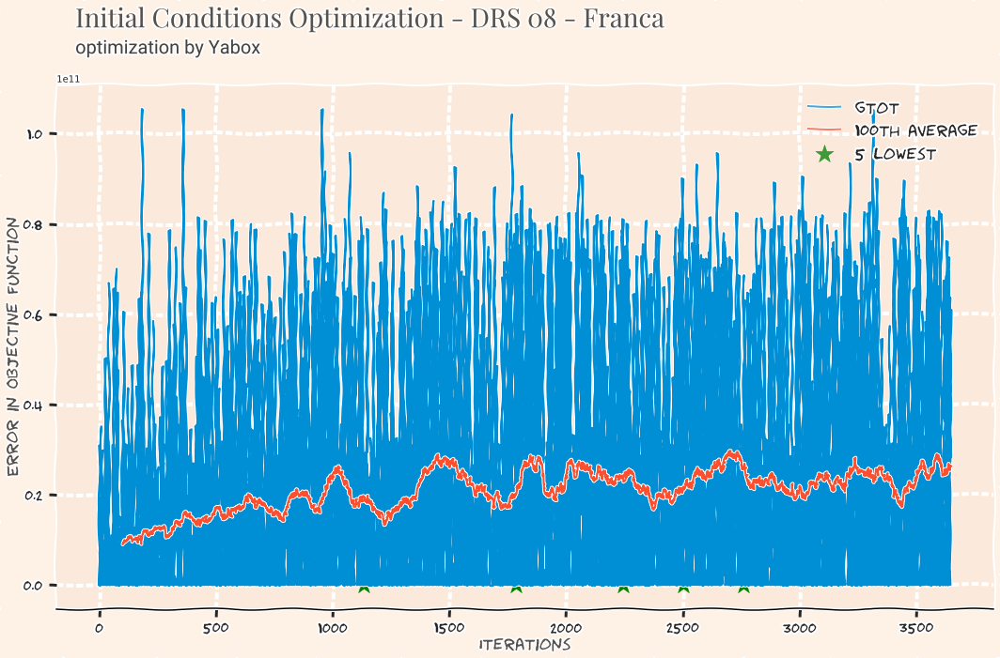

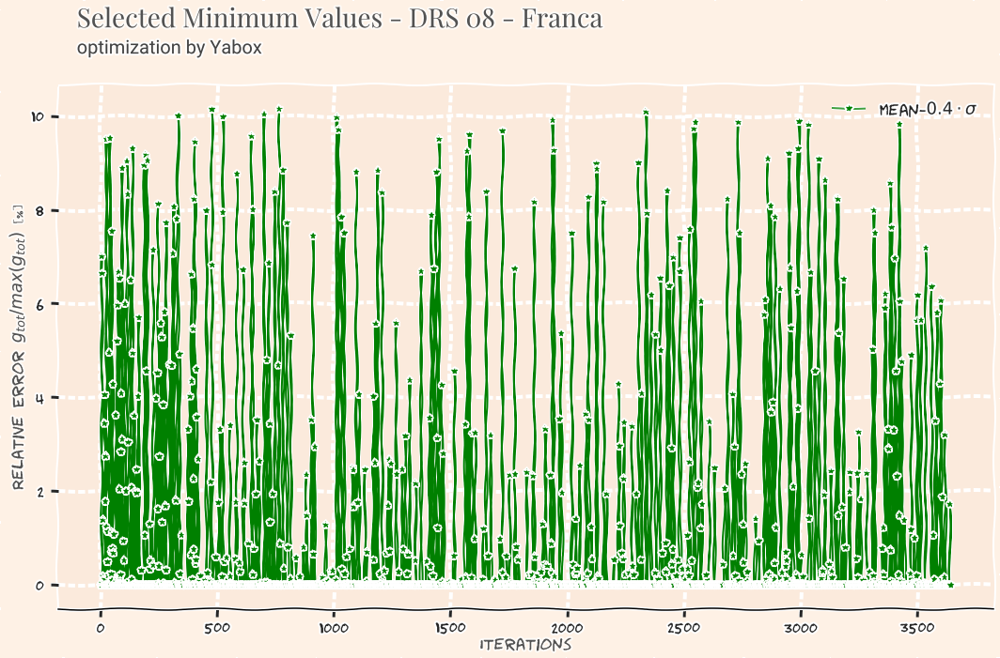

# Results for DRS 09 - Marília District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2596,15807,2020-03-30,22,456106,292,241,0.571,0.0187


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2596,15807,2020-03-30,22,456106,292,241,0.5710,0.0187
1061,52820,2020-04-01,43,403419,76,60,0.4539,0.0175
648,53053,2020-03-29,119,323515,988,1,0.4902,0.0395
2165,53301,2020-04-01,130,405271,136,44,0.6470,0.0149
380,54829,2020-03-31,67,406243,204,102,0.6470,0.0402


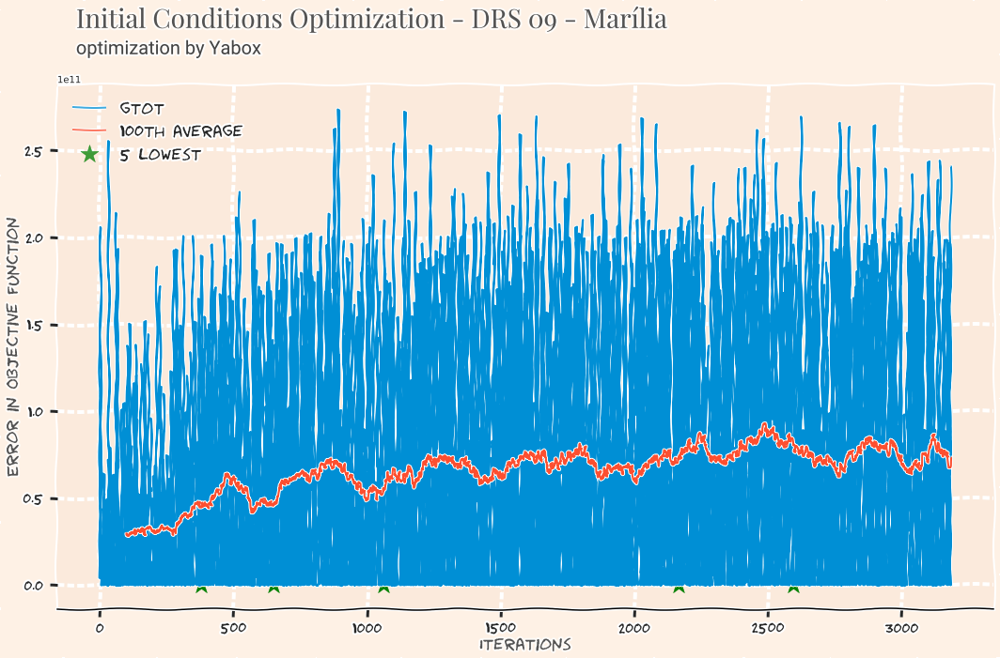

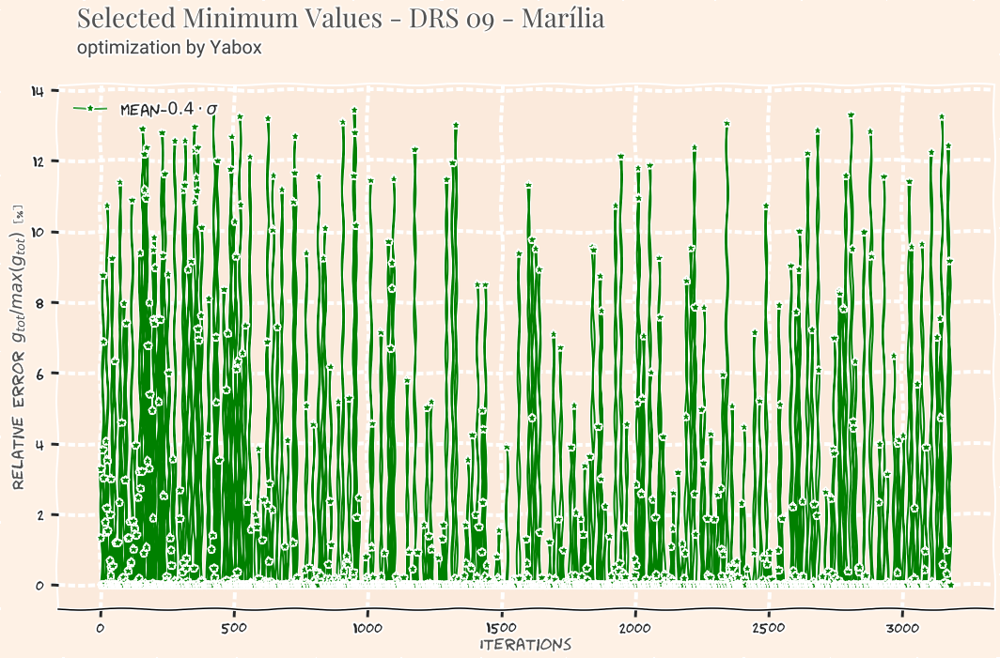

# Results for DRS 10 - Piracicaba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2738,94688,2020-04-02,142,493679,384,119,0.4715,0.0408


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2738,94688,2020-04-02,142,493679,384,119,0.4715,0.0408
508,167631,2020-04-03,108,491232,586,49,0.6255,0.0320
2576,331632,2020-03-29,31,623552,138,94,0.5995,0.0107
849,357379,2020-04-03,217,502262,232,33,0.6248,0.0188
847,387296,2020-04-02,180,553668,116,140,0.6480,0.0032


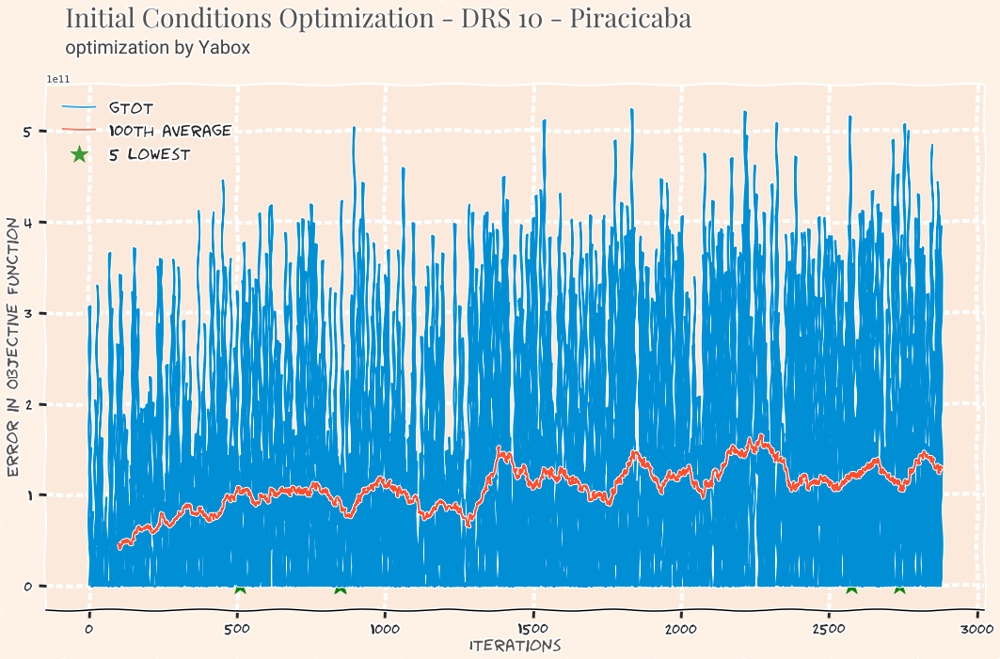

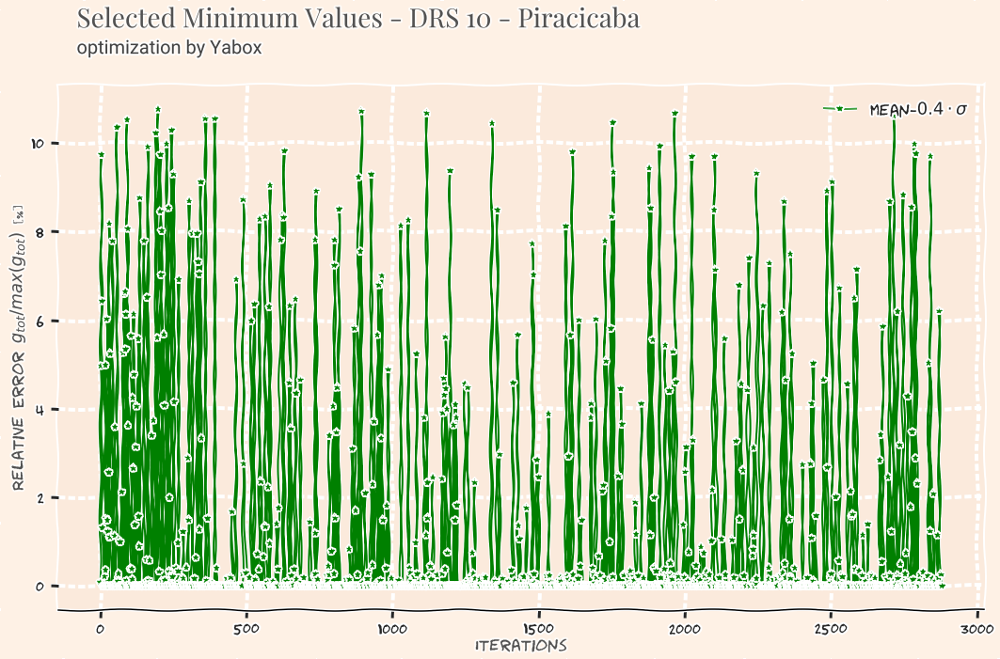

# Results for DRS 11 - Presidente Prudente District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
3173,4088,2020-03-31,57,112749,713,7,0.4746,0.0153


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
3173,4088,2020-03-31,57,112749,713,7,0.4746,0.0153
1880,14154,2020-04-01,55,308938,353,82,0.5696,0.0477
1133,18056,2020-04-02,193,291752,673,224,0.4944,0.0012
1067,19140,2020-03-30,8,301362,202,85,0.4696,0.0450
2267,27578,2020-03-31,84,213886,127,36,0.5606,0.0305


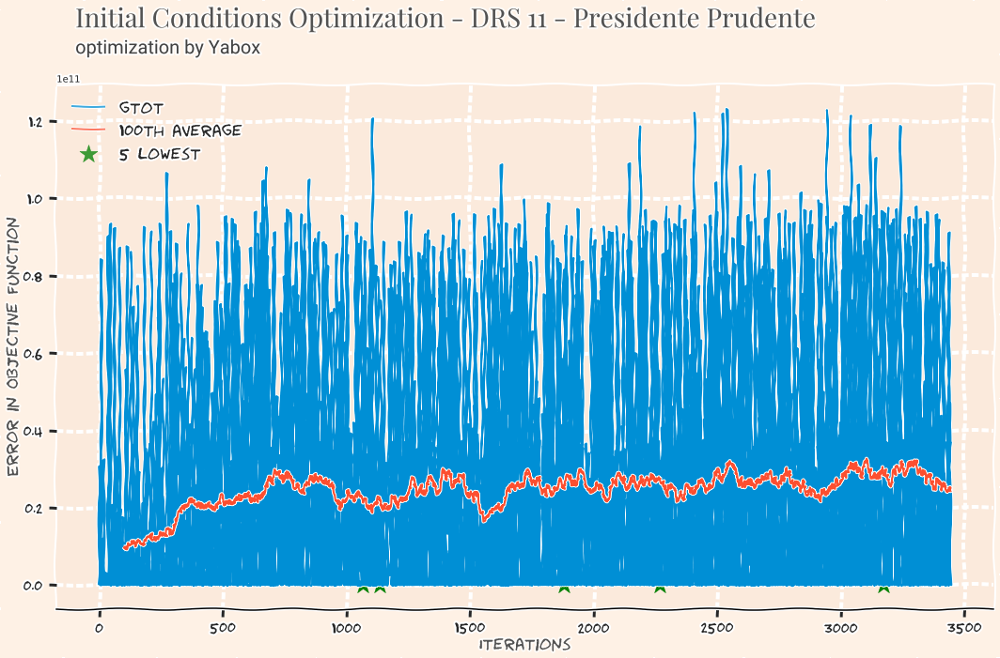

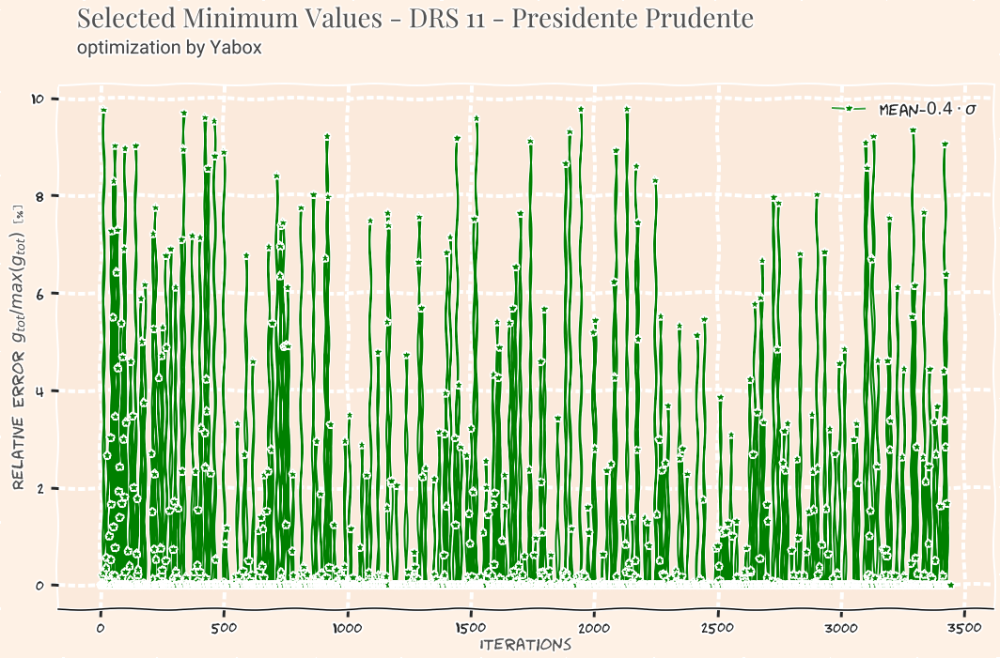

# Results for DRS 12 - Registro District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1921,5906,2020-03-31,10,107738,670,150,0.5636,0.036


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1921,5906,2020-03-31,10,107738,670,150,0.5636,0.0360
969,30641,2020-04-01,138,103761,168,134,0.5184,0.0454
2216,31122,2020-03-30,229,111048,62,22,0.5730,0.0158
594,32106,2020-03-30,187,62214,263,271,0.4742,0.0084
1805,32664,2020-03-29,150,106523,109,20,0.4396,0.0342


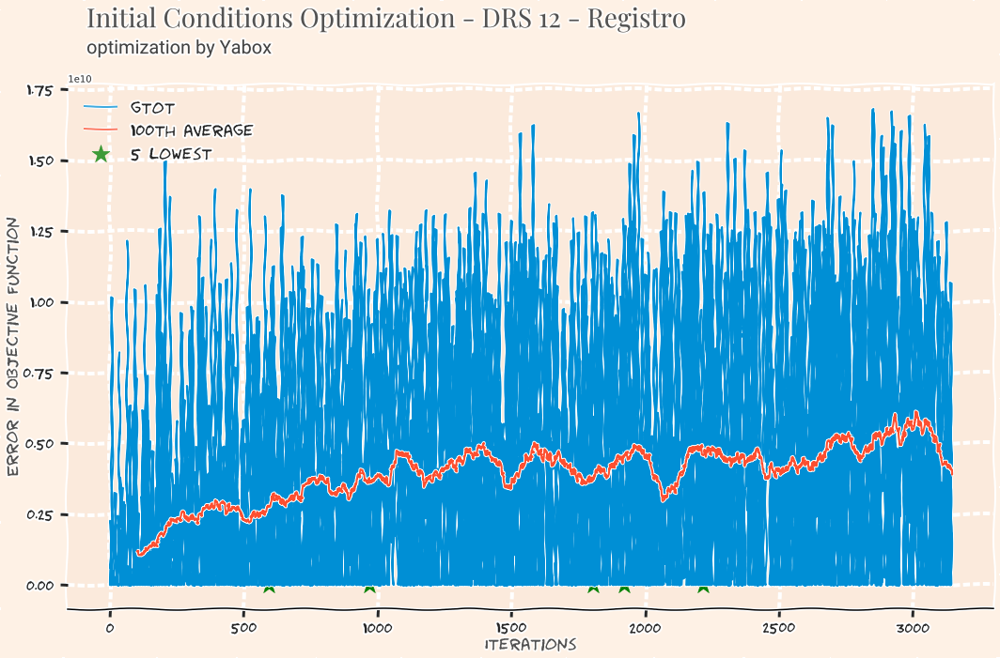

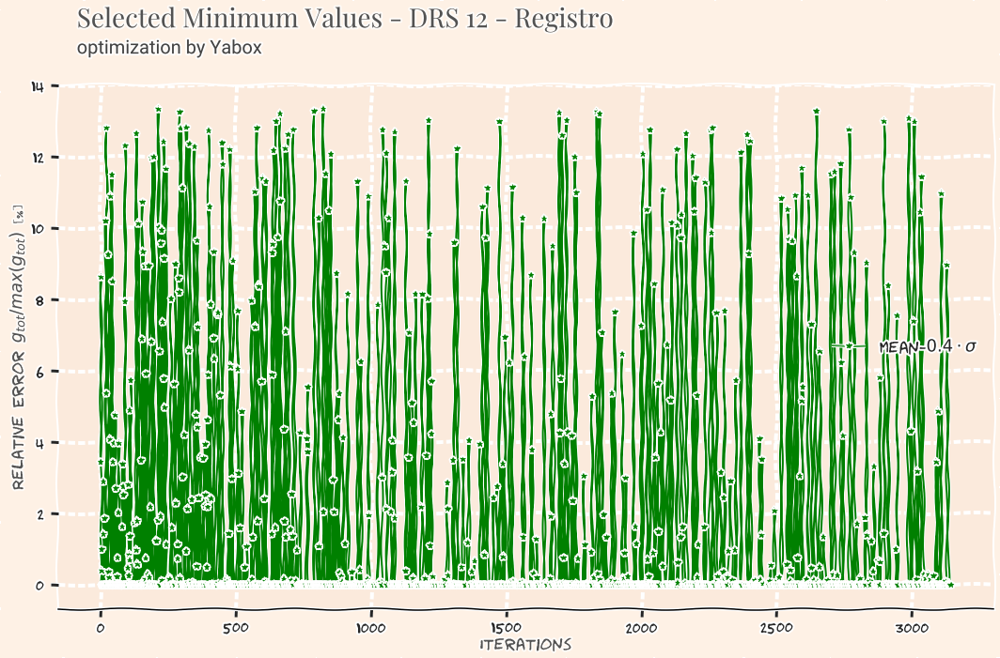

# Results for DRS 13 - Ribeirão Preto District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
275,84408,2020-03-30,220,459436,143,210,0.3633,0.0336


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
275,84408,2020-03-30,220,459436,143,210,0.3633,0.0336
1996,232978,2020-04-03,84,110390,577,32,0.6203,0.0349
1813,260250,2020-03-31,170,523146,94,170,0.4673,0.0054
971,285705,2020-03-30,81,509468,226,121,0.5927,0.0248
2143,307897,2020-03-31,29,563724,216,128,0.6492,0.0140


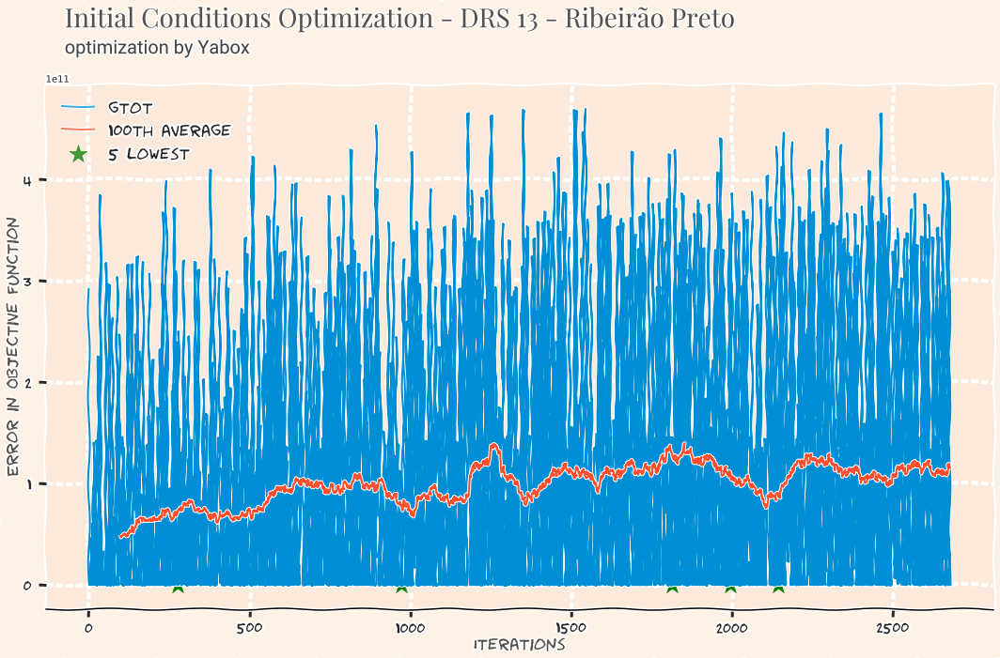

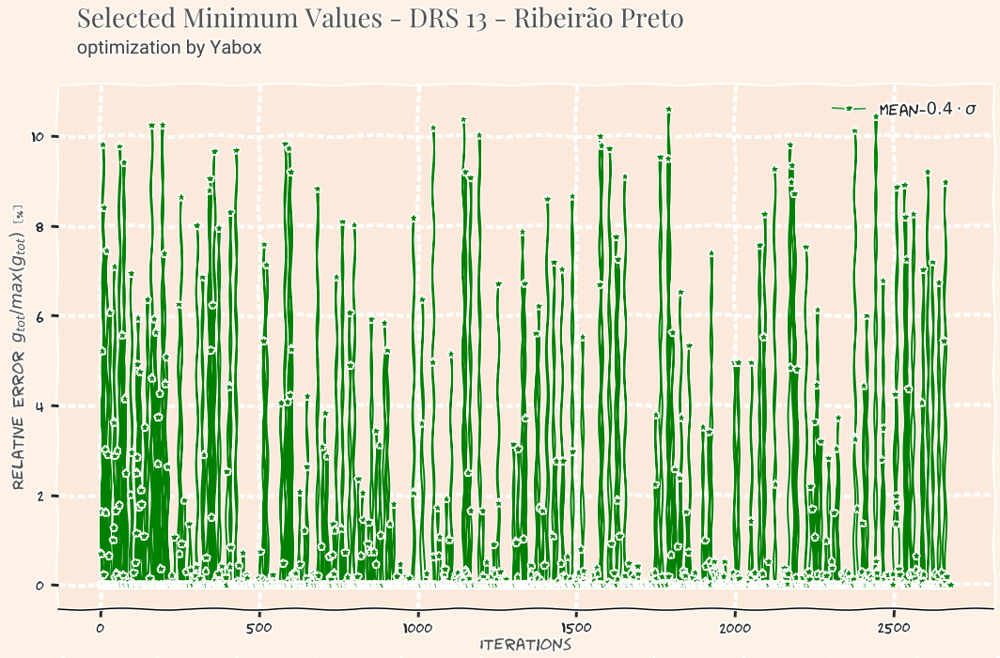

# Results for DRS 14 - São João da Boa Vista District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2190,33096,2020-03-31,249,324640,560,110,0.5655,0.0428


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2190,33096,2020-03-31,249,324640,560,110,0.5655,0.0428
1938,37803,2020-04-02,116,311753,399,268,0.5693,0.0412
487,51060,2020-03-29,112,103980,642,115,0.5950,0.0382
946,51285,2020-04-01,50,271469,122,52,0.4329,0.0369
2148,51423,2020-04-02,52,309101,269,6,0.4126,0.0237


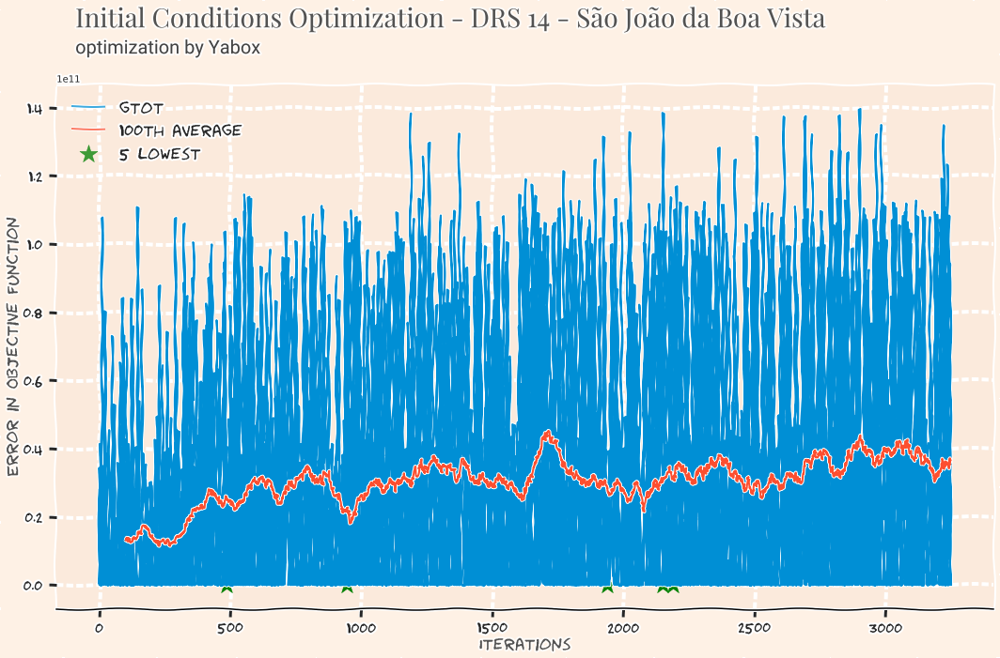

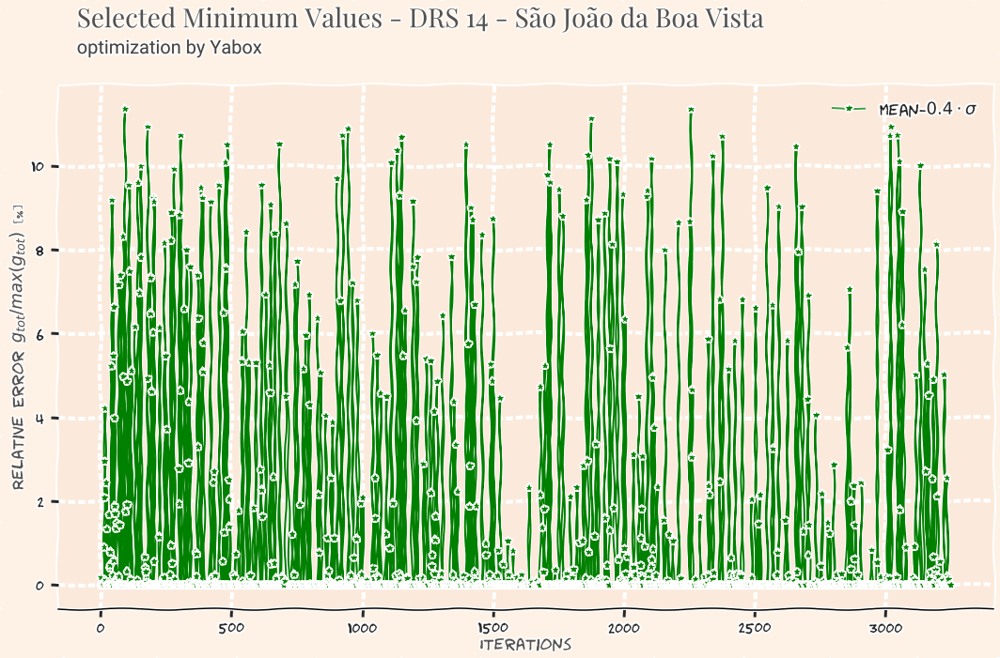

# Results for DRS 15 - São José do Rio Preto District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1012,104055,2020-04-02,199,585581,747,243,0.5759,0.0302


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
1012,104055,2020-04-02,199,585581,747,243,0.5759,0.0302
1071,250302,2020-04-02,87,626327,506,82,0.5383,0.0391
1326,365484,2020-04-02,84,460941,873,10,0.5841,0.0332
1936,386466,2020-03-31,6,635968,461,155,0.6320,0.0385
1444,388029,2020-03-30,228,525547,99,131,0.6306,0.0262


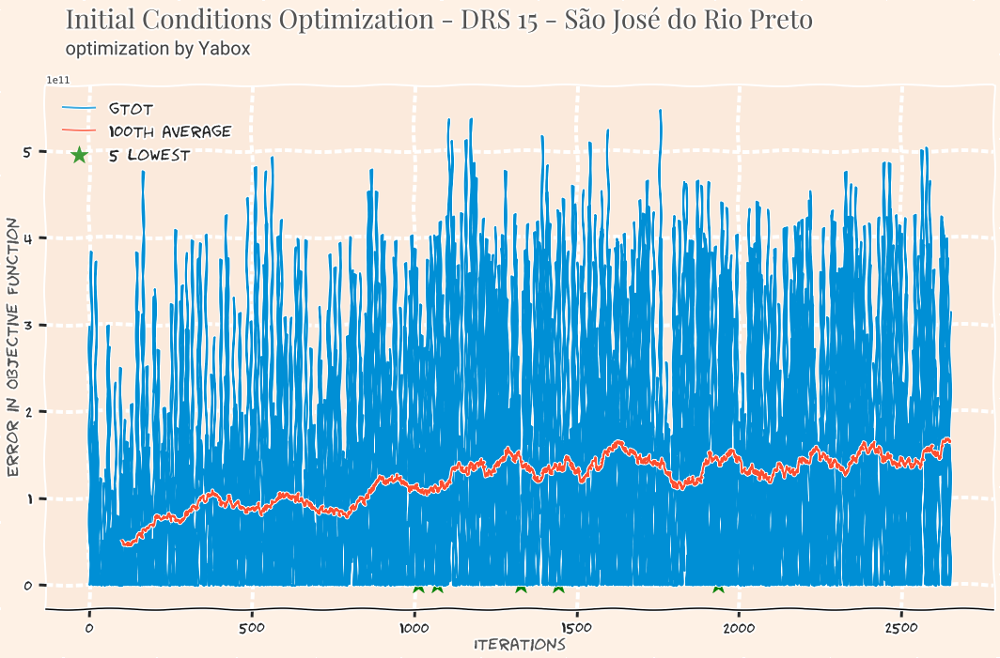

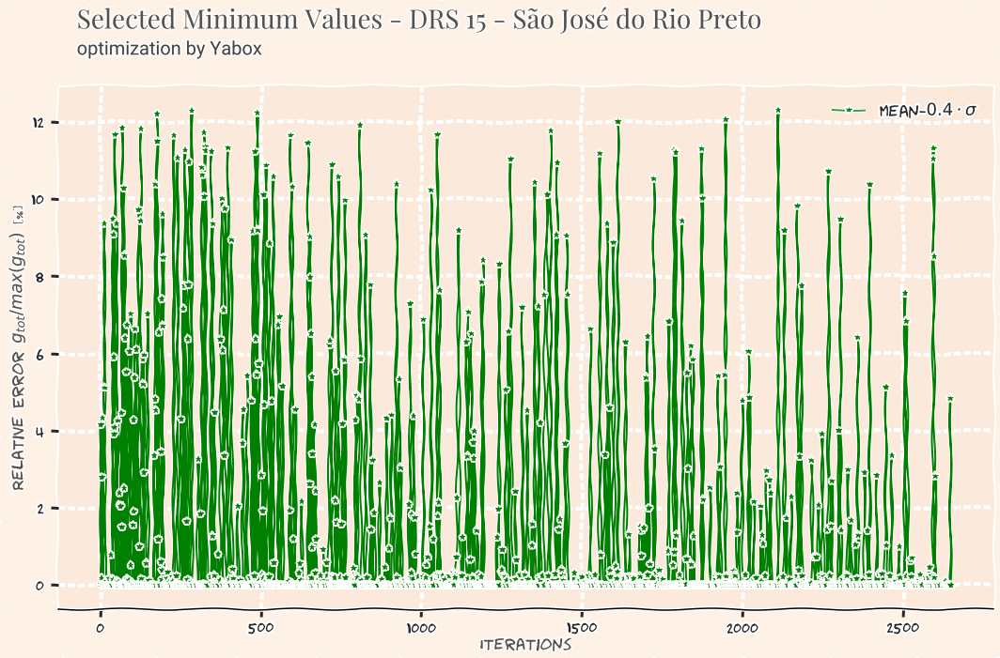

# Results for DRS 16 - Sorocaba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2054,168750,2020-03-31,65,944202,233,297,0.4734,0.0184


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
2054,168750,2020-03-31,65,944202,233,297,0.4734,0.0184
2404,211751,2020-03-31,232,997624,233,86,0.6170,0.0075
227,215035,2020-03-31,118,371196,562,241,0.4580,0.0164
1416,352010,2020-04-01,53,927467,287,182,0.5748,0.0163
2442,468214,2020-04-03,29,1010577,416,228,0.6370,0.0368


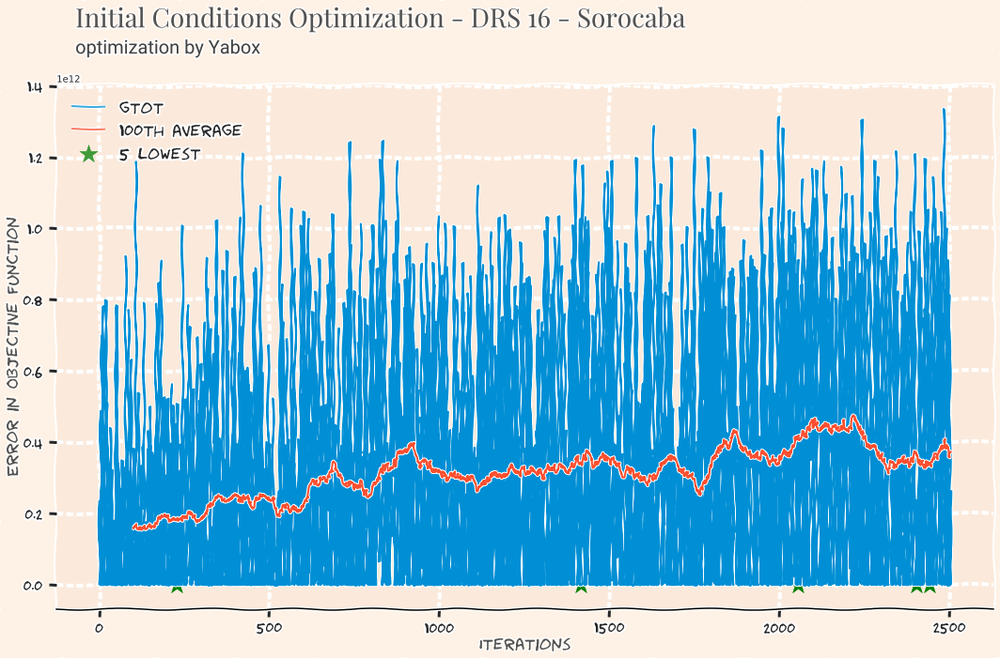

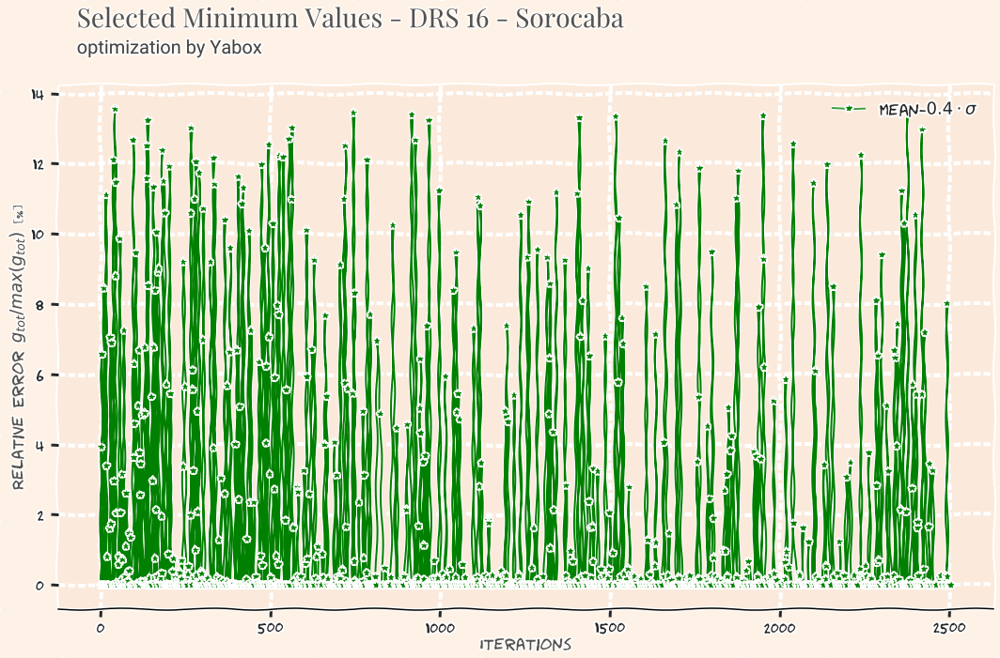

# Results for DRS 17 - Taubaté District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
679,114182,2020-03-31,163,954226,703,140,0.4644,0.0163


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
679,114182,2020-03-31,163,954226,703,140,0.4644,0.0163
1872,172486,2020-04-01,173,992288,437,167,0.4725,0.0104
1842,226011,2020-03-31,220,947088,505,296,0.4383,0.0253
1108,394642,2020-04-03,160,985044,383,64,0.6417,0.0304
1074,403124,2020-04-03,154,891725,237,88,0.6270,0.0119


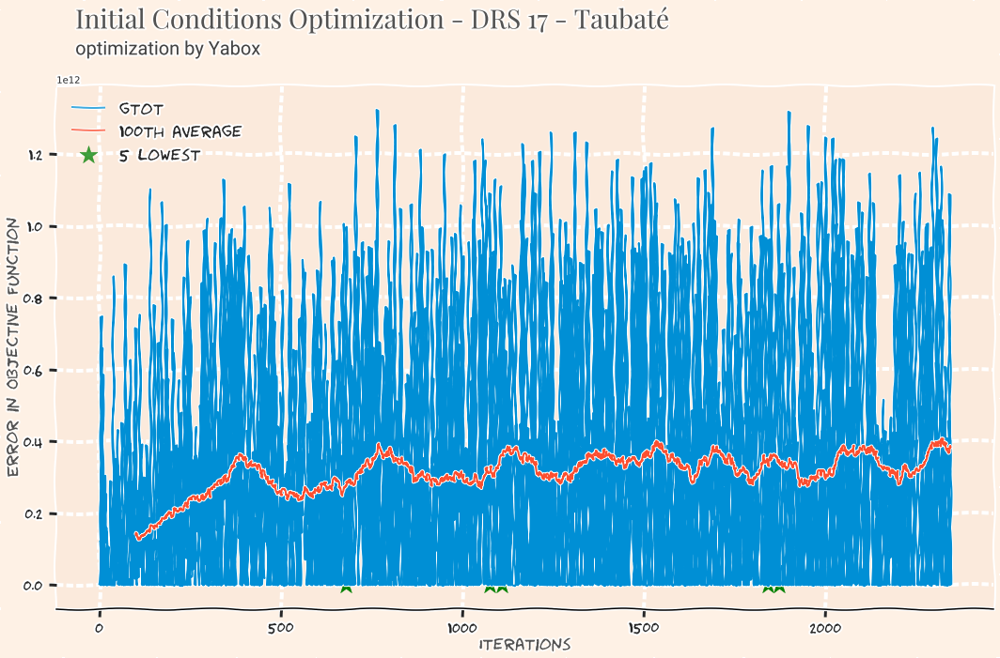

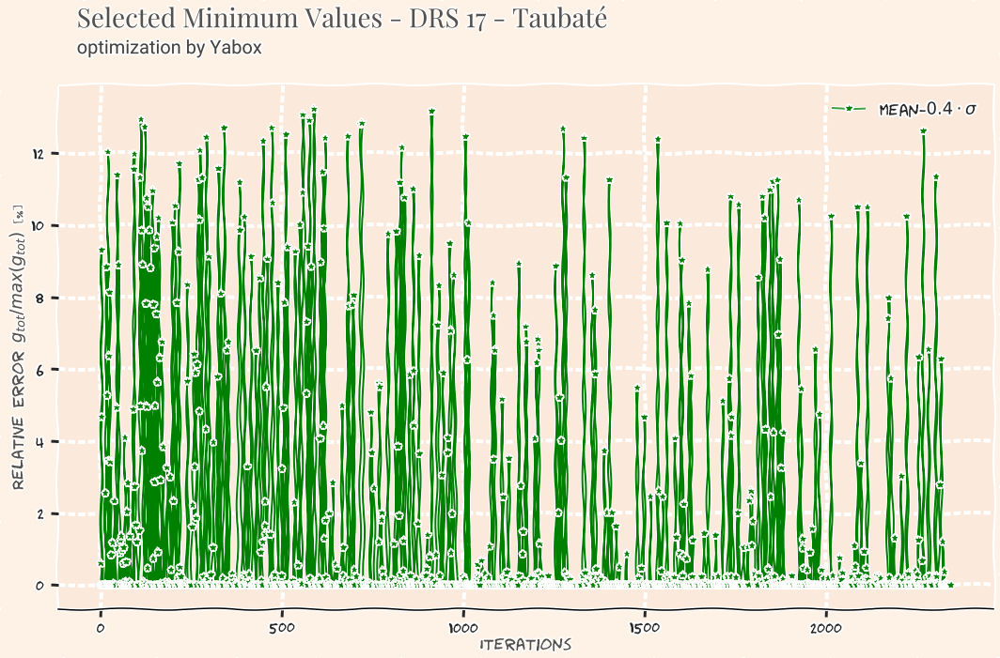

In [173]:
ggtot=[]
for districtRegion in DRS:
    versionStr=str(version)
    dateparse = lambda x: datetime.strptime(x, ' %Y-%m-%d')
    histOptAll= pd.read_table('./results/history_'+districtRegion+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["districtRegion","gtot",\
            "s0","startdate","i0","d0","startNcases","wcases","wrec"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","wcases","wrec"]]
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
    histOptAll['gtot'] = histOptAll['gtot'].apply(lambda x: int(x+0.5))
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    display(Markdown("# Results for "+districtRegion+" District Region"))
    display(histOpt.iloc[:,0:8])
    histOpt.to_csv("data/vars_optimized_"+districtRegion+model+"HistMin.csv", sep=",", index=False)
        
    #current parameters
    query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    if len(parameters)>12:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec,popEst = parameters
    else:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
    dfparam['s0'] = dfparam['s0'].astype(int)
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam['i0'] = dfparam['i0'].astype(int)
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "START"] = histOpt.startNcases
    
    dfparam['a0'] = dfparam['a0'].astype(int)
    dfparam['e0'] = dfparam['i0'].astype(int)
    dfparam['r0'] = dfparam['r0'].astype(int)
    dfparam['d0'] = dfparam['d0'].astype(int)
    #define Start N Cases
    dfparam['START'] = dfparam['START'].apply(lambda x: int(x+0.5))
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%Y-%m-%d').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)
    
    ggtot.append(histOpt.gtot.values[0])
    
    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:8]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='green',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average")

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Initial Conditions Optimization - "+districtRegion,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+districtRegion+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:8]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
        y=histMin.error[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
                
        ax.plot(x, y, label="mean-$0.4 \cdot \sigma$",c='green',marker='*')
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Selected Minimum Values - "+districtRegion,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+districtRegion+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()

In [174]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import HTML

dfparam["gtot"] = pd.Series(ggtot)
dfparam['gtot'] = dfparam['gtot'].astype(int)
dfparam['RATIO'] = dfparam['RATIO'].round(decimals=2)

gtot_min=dfparam.gtot.min()
gtot_max=dfparam.gtot.max()
gtot_range=gtot_max-gtot_min
gtot_mean=dfparam.gtot.mean()
gtot_std=dfparam.gtot.std()

gtot_high=(gtot_mean)/gtot_range
gtot_low=abs(gtot_mean-gtot_std)/gtot_range

s = dfparam.style.background_gradient(cmap='RdYlGn_r',
            axis=0,subset=['s0','i0','d0','gtot'],low=gtot_low/2.74,high=gtot_high/100)
display(s)

# Final Results for Initial Conditions

## Yabox optimization model

,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC,gtot
0,DRS 01 - Grande São Paulo,2020-03-18,200,7840120,136,0,136,300,196,117,0.150000,0.495000,0.008100,32985761
1,DRS 02 - Araçatuba,2020-03-29,200,282699,182,0,182,0,51,5,0.150000,0.625700,0.036200,32896
2,DRS 03 - Araraquara,2020-03-30,200,377711,534,0,534,0,102,93,0.150000,0.505600,0.003400,26950
3,DRS 04 - Baixada Santista,2020-04-01,200,718013,270,0,270,0,281,155,0.150000,0.406200,0.012400,1454767
4,DRS 05 - Barretos,2020-04-03,200,147064,883,0,883,0,14,105,0.150000,0.353500,0.021100,2136
5,DRS 06 - Bauru,2020-04-01,200,717995,263,0,263,0,201,59,0.150000,0.544300,0.030400,177999
6,DRS 07 - Campinas,2020-03-29,200,1865626,602,0,602,0,9,20,0.150000,0.546100,0.028200,2951833
7,DRS 08 - Franca,2020-04-01,200,237187,37,0,37,0,26,3,0.150000,0.408800,0.025700,13666
8,DRS 09 - Marília,2020-03-30,200,456106,292,0,292,0,241,22,0.150000,0.571000,0.018700,15807
9,DRS 10 - Piracicaba,2020-04-02,200,493679,384,0,384,0,119,142,0.150000,0.471500,0.040800,94688
